In [1]:
import numpy as np
import pandas as pd
import pydicom
import os
import matplotlib.pyplot as plt
import collections
from tqdm import tqdm_notebook as tqdm
from datetime import datetime
from scipy import ndimage

from math import ceil, floor, log
import cv2

import tensorflow as tf

tf.test.is_gpu_available()

True

In [2]:
from __future__ import print_function
import tensorflow.keras
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization, MaxPooling2D, UpSampling2D, Dropout
from tensorflow.keras.layers import AveragePooling2D, Input, Flatten, Concatenate, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.regularizers import l2
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import LeakyReLU, PReLU
import math
import numpy as np
import os
import pickle
import time
from scipy import misc

In [3]:
# create the table
train_path = '/home/yunan/motion/full_train/'
val_path = '/home/yunan/motion/full_val/'
# train_path = 'C:/Users/YuNan/Downloads/motion/img_full/rotate/'
# val_path = 'C:/Users/YuNan/Downloads/motion/img_full/rotate_val/'

train_list = os.listdir(train_path)
val_list = os.listdir(val_path)
# print(val_list)

In [4]:
dict = {'train': train_list}
df_train = pd.DataFrame(dict)  
    
# saving the dataframe  
# df.to_csv('train.csv', index = False)  

dict = {'val': val_list}
df_val = pd.DataFrame(dict)  
df_val.head(10)
# saving the dataframe  
# df.to_csv('val.csv', index = False)

,val
0,108_6_random.png
1,107_0_all.png
2,108_7_all.png
3,107_0_random.png
4,108_6_sin.png
5,107_0_sin.png
6,108_7_random.png
7,107_1_all.png
8,108_7_sin.png
9,107_1_random.png


In [5]:
df_train = df_train.set_index(['train'])
df_val = df_val.set_index(['val'])
df_val.index

Index(['108_6_random.png', '107_0_all.png', '108_7_all.png',
       '107_0_random.png', '108_6_sin.png', '107_0_sin.png',
       '108_7_random.png', '107_1_all.png', '108_7_sin.png',
       '107_1_random.png',
       ...
       '103P_trans_sinu_ave.png', '103P_trans_sinu_1_10.png',
       '103P_trans_hori_ave.png', '103P_trans_hori_1_10.png',
       '103P_rot_ave.png', '103P_rot_1_2.png', '103I_sin_mot_centric.png',
       '103I_rot_mix.png', '103I_lin_mot_centric.png',
       '103I_interl_mot_centric.png'],
      dtype='object', name='val', length=1198)

In [6]:
# generator

# model
import copy
n_f = 32
def conv_block(x, n_f, strides_x, strides_y):
    x2 = Conv2D(filters=n_f, kernel_size=(3,3), strides=(strides_x, strides_y), kernel_initializer='he_normal', padding='same')(x)
    x2 = BatchNormalization(axis=-1, epsilon=1e-3)(x2)
    x2 = LeakyReLU(alpha=0.3)(x2)
    return x2
#####U-net block####
def m_block(x):
    x2 = conv_block(x, n_f, 1, 1)
    x2 = conv_block(x2, n_f, 1, 1)
#     x2 = Dropout(0.3)(x2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(x2)
    
    x3 = conv_block(pool2, n_f, 1, 1)
    x3 = conv_block(x3, n_f, 1, 1)
#     x3 = Dropout(0.3)(x3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(x3)
    
    x4 = conv_block(pool3, n_f, 1, 1)
    x4 = conv_block(x4, n_f, 1, 1)
#     x4 = Dropout(0.3)(x4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(x4)

    x5 = conv_block(pool4, n_f, 1, 1)
    x5 = conv_block(x5, n_f, 1, 1)
#     x5 = Dropout(0.3)(x5)
    pool5 = MaxPooling2D(pool_size=(2, 2))(x5)
    
    x6 = conv_block(pool5, n_f, 1, 1)
    x6 = conv_block(x6, n_f, 1, 1)
#     x6 = Dropout(0.3)(x6)
    
    up7 = UpSampling2D(size = (2,2))(x6)
    up7 = conv_block(up7, n_f, 1, 1)
    merge7 = Concatenate(axis=-1)([x5,up7])
    x7 = conv_block(merge7, n_f, 1, 1)
    x7 = conv_block(x7, n_f, 1, 1)
#     x7 = Dropout(0.3)(x7)
    
    up8 = UpSampling2D(size = (2,2))(x7)
    up8 = conv_block(up8, n_f, 1, 1)
    merge8 = Concatenate(axis=-1)([x4,up8])
    x8 = conv_block(merge8, n_f, 1, 1)
    x8 = conv_block(x8, n_f, 1, 1)
#     x8 = Dropout(0.3)(x8)

    up9 = UpSampling2D(size = (2,2))(x8)
    up9 = conv_block(up9, n_f, 1, 1)
    merge9 = Concatenate(axis=-1)([x3,up9])
    x9 = conv_block(merge9, n_f, 1, 1)
    x9 = conv_block(x9, n_f, 1, 1)
#     x9 = Dropout(0.3)(x9)
    
    up10 = UpSampling2D(size = (2,2))(x9)
    up10 = conv_block(up10, n_f, 1, 1)
    merge10 = Concatenate(axis=-1)([x2,up10])
    x10 = conv_block(merge10, n_f, 1, 1)
    x10 = conv_block(x10, n_f, 1, 1)
#     x10 = Dropout(0.3)(x10)
    return x10
#####res block##########
def res_block(x_in,n_layer):
    for i in range(n_layer):
        x_r = m_block(x_in)
    x_r_block = tensorflow.keras.layers.Add()([x_in, x_r])
    x_r_block = LeakyReLU(alpha=0.3)(x_r_block)
    return x_r_block
#####dense block#########
def dense_block(x, n_layer):
    list_feat = [x]
#     x2 = m_block(x)
#     list_feat.append(x2)
#     concat2 = Concatenate(axis=-1)(list_feat)
    
#     x3 = m_block(concat2)
#     list_feat.append(x3)
#     concat3 = Concatenate(axis=-1)(list_feat)
    
#     return concat3|
    for i in range(n_layer):
        x = m_block(x)
        list_feat.append(x)
        x = Concatenate(axis=-1)(copy.copy(list_feat))
#         print(list_feat)
    return x

In [7]:
inpt = Input(shape=(512,512,1))
######dense net######
x_b = dense_block(inpt, 3)

######res net
# x_b = res_block(inpt,1)
# for i in range(2):
#     x_b = res_block(x_b,1)
#########
x_b = conv_block(x_b, 1, 1, 1)
# print(x_b)
x_out = tensorflow.keras.layers.Subtract()([inpt, x_b])   # input - noise
# print(x_out)
generator = Model(inputs=inpt, outputs=x_out)


generator.summary()


Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 512, 512, 32) 320         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 512, 512, 32) 128         conv2d[0][0]                     
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 512, 512, 32) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [8]:
# discriminator network
image_input = tensorflow.keras.layers.Input(shape=(512, 512, 1))
x = conv_block(image_input, n_f, 1, 1)
x = MaxPooling2D(pool_size=(2, 2))(x)

x = conv_block(x, n_f, 1, 1)
x = MaxPooling2D(pool_size=(2, 2))(x)

x = conv_block(x, n_f, 1, 1)
x = MaxPooling2D(pool_size=(2, 2))(x)

x = conv_block(x, n_f, 1, 1)
x = MaxPooling2D(pool_size=(2, 2))(x)

x = conv_block(x, n_f, 1, 1)
x = MaxPooling2D(pool_size=(2, 2))(x)

x = conv_block(x, n_f, 1, 1)
x = MaxPooling2D(pool_size=(2, 2))(x)

x = tensorflow.keras.layers.Flatten()(x)
# x = tensorflow.keras.layers.Dense(256, activation='relu')(x)
x = tensorflow.keras.layers.Dense(16)(x)
x = LeakyReLU(alpha=0.3)(x)
x = tensorflow.keras.layers.Dropout(0.2)(x)
x = tensorflow.keras.layers.Dense(1)(x)


# from tensorflow.keras.applications import DenseNet121
# DN = DenseNet121(include_top=False, weights = None, input_shape=(512,512, 1))
# DN2 = Flatten()(DN.layers[-1].output)
# DN2 = Dense(256, activation='relu')(DN2)
# DN2 = Dropout(0.3)(DN2)
# DN2 = Dense(1)(DN2)
# output = Activation('sigmoid')(DN2)
discriminator = Model(inputs=image_input, outputs=x)
discriminator.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 512, 512, 1)]     0         
_________________________________________________________________
conv2d_67 (Conv2D)           (None, 512, 512, 32)      320       
_________________________________________________________________
batch_normalization_67 (Batc (None, 512, 512, 32)      128       
_________________________________________________________________
leaky_re_lu_67 (LeakyReLU)   (None, 512, 512, 32)      0         
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 256, 256, 32)      0         
_________________________________________________________________
conv2d_68 (Conv2D)           (None, 256, 256, 32)      9248      
_________________________________________________________________
batch_normalization_68 (Batc (None, 256, 256, 32)      128 

In [9]:
# adam_optimizer = Adam(learning_rate=0.00005, beta_1=0.5)
# discriminator_network.compile(loss='binary_crossentropy', optimizer=adam_optimizer, metrics=['accuracy'])

In [10]:
# discriminator_network.trainable=False

g_output = generator(inpt)
d_output = discriminator(g_output)

gan_model = tensorflow.keras.models.Model(inpt, d_output)
gan_model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 512, 512, 1)]     0         
_________________________________________________________________
model (Model)                (None, 512, 512, 1)       731150    
_________________________________________________________________
model_1 (Model)              (None, 1)                 80129     
Total params: 811,279
Trainable params: 806,669
Non-trainable params: 4,610
_________________________________________________________________


In [11]:
generator.load_weights('/home/yunan/motion/model/model_denoising2.hdf5', by_name = True)  # cannot repeat, interesting here 

In [12]:
# gan_model.compile(loss='binary_crossentropy', optimizer=adam_optimizer)

In [30]:
from tensorflow import keras
def load(image_file):
    
    image = tf.io.read_file(image_file)
    image = tf.image.decode_png(image, channels=1)

    w = tf.shape(image)[1]
    
    w = w // 2
    real_image = image[:, :w, :]
    input_image = image[:, w:, :]
    
    input_image = tf.cast(input_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)
    
#     tf.print(tf.shape(input_image)) #[512 512 1]
#     tf.print(w) # 512

    return input_image, real_image

# inp, re = load('/home/yunan/motion/full_val/z_1_49.png')

In [31]:
# plt.figure()
# plt.imshow(inp/255.0)
# plt.figure()
# plt.imshow(re/255.0)

In [32]:
def normalize(input_image, real_image):
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1

    return input_image, real_image

def load_image_train(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image

def load_image_test(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image

In [33]:
# Train
BUFFER_SIZE = 200
BATCH_SIZE = 2

PATH = '/home/yunan/motion/'
train_dataset = tf.data.Dataset.list_files(PATH+'full_train/*.png')
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

# Test without shuffle in each iteration
test_dataset = tf.data.Dataset.list_files(PATH+'full_val/*.png', shuffle = False)
test_dataset = test_dataset.shuffle(BUFFER_SIZE, reshuffle_each_iteration=False)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

# Test with shuffle in each iteration
test_dataset_shuffle = tf.data.Dataset.list_files(PATH+'full_val/*.png')
# test_dataset_shuffle = test_dataset.shuffle(BUFFER_SIZE)
test_dataset_shuffle = test_dataset_shuffle.map(load_image_test)
test_dataset_shuffle = test_dataset_shuffle.batch(BATCH_SIZE)

In [34]:
# tf.keras.utils.plot_model(gan_model, show_shapes=True, dpi=64)

In [35]:
from tensorflow.keras.applications.vgg16 import VGG16
lossModel = VGG16(include_top=False, weights= 'imagenet', input_shape=(512,512,3))
lossModel.trainable = False
for l in lossModel.layers:
    l.trainable = False

def Perceptual_model(lossModel, VGG_in):
    #select layers
    selectedLayers = 17 #for instance
    # lossModel.summary()
#     selectedOutputs = [lossModel.layers[i].output for i in selectedLayers]
    selectedOutputs = lossModel.layers[selectedLayers].output
    perModel = Model(lossModel.inputs,selectedOutputs)
    lossModelOutputs = perModel(VGG_in)
    return lossModelOutputs

In [36]:
# LAMBDA1 = 0.01
# LAMBDA2 = 1
# LAMBDA3 = 100
# LAMBDA1 = 0.5
# LAMBDA2 = 10
# LAMBDA3 = 100
LAMBDA1 = 0.001
LAMBDA2 = 1.0
LAMBDA3 = 0.2
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    
#     gen_output_scale = (gen_output + tf.constant(1.0)) * tf.constant(0.5) * tf.constant(255.0)
#     target_scale = (target + tf.constant(1.0)) * tf.constant(0.5) * tf.constant(255.0)
    gen_output_scale = (gen_output + 1.0) * 0.5 * 255.0
    target_scale = (target + 1.0) * 0.5 * 255.0
    
    vgg_input = tf.concat([gen_output_scale, gen_output_scale, gen_output_scale], -1)
    target_vgg_input = tf.concat([target_scale,target_scale,target_scale], -1)
    
    vgg_input = tf.keras.applications.vgg16.preprocess_input(vgg_input)
    target_vgg_input = tf.keras.applications.vgg16.preprocess_input(target_vgg_input)
    
    
#     percep_loss = K.mean(K.square(Perceptual_model(lossModel, target_vgg_input) - Perceptual_model(lossModel, vgg_input)), axis = [1,2] )
    percep_loss = tf.keras.losses.MSE(Perceptual_model(lossModel, target_vgg_input), Perceptual_model(lossModel, vgg_input))
    percep_loss = K.mean(percep_loss, axis = [0,1,2])
#     tf.print(percep_loss)
#     tf.print(percep_loss.shape)
    # mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
#     tf.print('***')
#     tf.print(l1_loss)

    total_gen_loss = (LAMBDA1 * gan_loss) + (LAMBDA2 * l1_loss) + (LAMBDA3 * percep_loss)

    return total_gen_loss, LAMBDA1 * gan_loss, LAMBDA2 * l1_loss, LAMBDA3 * percep_loss 

In [37]:
# Cell 9
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

In [38]:
# Cell 10
generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)  # the only thing changed here. 
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)

checkpoint_dir = './model/percep_latest/'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [39]:
# test_dataset = test_dataset.shuffle(BUFFER_SIZE, seed = 2, reshuffle_each_iteration=False)
# picked_example = test_dataset.take(1)
# test_dataset_skip1 = test_dataset.skip(1)


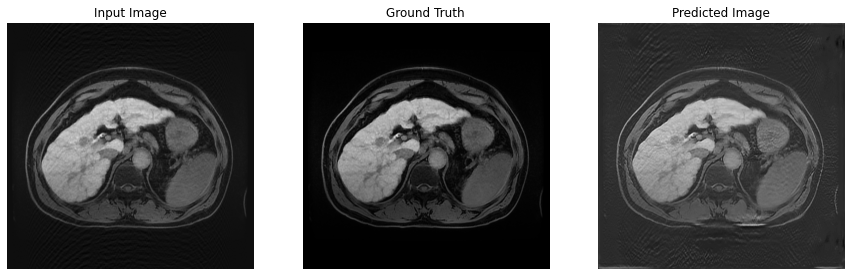

Mean Squared Error: 0.009770129807293415


In [40]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i][:,:,0] * 0.5 + 0.5, cmap='gray')
        plt.axis('off')
    plt.show()

    mse = (np.square(tar - prediction)).mean()
    print (f'Mean Squared Error: {mse}')

for example_input, example_target in test_dataset.take(1):
#     tf.print(tf.shape(example_input)) # [2 512 512 1]
#     tf.print(tf.shape(example_target))# [2 512 512 1]
    generate_images(generator, example_input, example_target)
# for example_input, example_target in test_dataset_skip1.take(1):
# #     tf.print(tf.shape(example_input)) # [2 512 512 1]
# #     tf.print(tf.shape(example_target))# [2 512 512 1]
#     generate_images(generator, example_input, example_target)

In [41]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

# @tf.function
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)   # concatenate 

        disc_real_output = discriminator(target, training=True)
        disc_generated_output = discriminator(gen_output, training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss, per_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))
#     tf.print('epoch:',epoch,'gen_total_loss', gen_total_loss)
#     tf.print('epoch:',epoch,'gen_gan_loss', gen_gan_loss)
#     tf.print('epoch:',epoch,'gen_l1_loss', gen_l1_loss)
#     tf.print('epoch:',epoch,'disc_loss', disc_loss)
#     tf.print('epoch:',epoch,'per_loss', per_loss)
    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
        tf.summary.scalar('disc_loss', disc_loss, step=epoch)
        tf.summary.scalar('per_loss', per_loss, step=epoch)
    return gen_total_loss,gen_gan_loss, gen_l1_loss, per_loss, disc_loss



In [42]:
# @tf.function
def val_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=False)   # concatenate 

        disc_real_output = discriminator(target, training=False)
        disc_generated_output = discriminator(gen_output, training=False)

        gen_total_loss, gen_gan_loss, gen_l1_loss, per_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss_val', gen_total_loss, step=epoch)
        tf.summary.scalar('gen_gan_loss_val', gen_gan_loss, step=epoch)
        tf.summary.scalar('gen_l1_loss_val', gen_l1_loss, step=epoch)
        tf.summary.scalar('disc_loss_val', disc_loss, step=epoch)
        tf.summary.scalar('per_loss_val', per_loss, step=epoch)
    return gen_total_loss,gen_gan_loss, gen_l1_loss, per_loss, disc_loss


In [27]:
# Training Loop
#   - Iterates over the number of epochs.
#   - On each epoch it clears the display, and runs `generate_images` to show it's progress.
#   - On each epoch it iterates over the training dataset, printing a '.' for each example.
#   - It saves a checkpoint every 20 epochs.
from IPython import display
def fit(train_ds, epochs, test_ds):
    # stopping at the minimum val loss
    stopping_loss = 1000
    patience_count= 0
    patience_max = 5
#     picked_example = test_ds.take(1)
#     test_ds = test_ds.skip(1)
    for epoch in range(epochs):
        start = time.time()
#         display.clear_output(wait=True)
#         # the same datapoint
        for example_input, example_target in test_dataset.take(1):
            generate_images(generator, example_input, example_target)
        # different data point
        for example_input, example_target in test_dataset_shuffle.take(1):
            generate_images(generator, example_input, example_target)
        print("Epoch: ", epoch)

        # Train
        gen_total_loss_average = 0
        gen_gan_loss_average = 0
        gen_l1_loss_average = 0
        disc_loss_average = 0
        per_loss_average = 0
        for n, (input_image, target) in train_ds.enumerate():
            gen_total_loss,gen_gan_loss, gen_l1_loss, per_loss, disc_loss = train_step(input_image, target, epoch)
            gen_total_loss_average += gen_total_loss
            gen_gan_loss_average += gen_gan_loss
            gen_l1_loss_average += gen_l1_loss
            disc_loss_average += disc_loss
            per_loss_average += per_loss
#             if n == 2:
#                 break
        gen_total_loss_average /= tf.dtypes.cast(n+1, tf.float32)
        gen_gan_loss_average /= tf.dtypes.cast(n+1, tf.float32)
        gen_l1_loss_average /= tf.dtypes.cast(n+1, tf.float32)
        disc_loss_average /= tf.dtypes.cast(n+1, tf.float32)
        per_loss_average /= tf.dtypes.cast(n+1, tf.float32)
        print("Epoch:%.0f, gen_total_loss:%.3f, gen_gan_loss:%.3f, gen_l1_loss:%.3f, per_loss:%.3f, disc_loss:%.3f "%(epoch,gen_total_loss_average,gen_gan_loss_average, gen_l1_loss_average, per_loss_average, disc_loss_average))
        print('Time taken for epoch {} is {} sec\n'.format(epoch + 1,time.time()-start))
        
        # val
        gen_total_loss_val_average = 0
        gen_gan_loss_val_average = 0
        gen_l1_loss_val_average = 0
        disc_loss_val_average = 0
        per_loss_val_average = 0

        for n, (input_image, target) in test_ds.enumerate():
            gen_total_loss_val,gen_gan_loss_val, gen_l1_loss_val, per_loss_val, disc_loss_val = val_step(input_image, target, epoch)
            gen_total_loss_val_average += gen_total_loss_val
            gen_gan_loss_val_average += gen_gan_loss_val
            gen_l1_loss_val_average += gen_l1_loss_val
            disc_loss_val_average += disc_loss_val
            per_loss_val_average += per_loss_val
#             if n == 2:
#                 break
        gen_total_loss_val_average /= tf.dtypes.cast(n+1, tf.float32)
        gen_gan_loss_val_average /= tf.dtypes.cast(n+1, tf.float32)
        gen_l1_loss_val_average /= tf.dtypes.cast(n+1, tf.float32)
        disc_loss_val_average /= tf.dtypes.cast(n+1, tf.float32)
        per_loss_val_average /= tf.dtypes.cast(n+1, tf.float32)
        
        # saving (checkpoint) the model every epochs
        if gen_total_loss_val_average <= stopping_loss:
            stopping_loss = gen_total_loss_val_average
            patience_count = 0
            checkpoint.save(file_prefix = checkpoint_prefix)
            print("Epoch:%.0f, gen_total_loss_val:%.3f, gen_gan_loss_val:%.3f, gen_l1_loss_val:%.3f, per_loss_val:%.3f, disc_loss_val:%.3f "%(epoch,gen_total_loss_val_average,gen_gan_loss_val_average, gen_l1_loss_val_average, per_loss_val_average, disc_loss_val_average))
            print('Time taken for epoch {} is {} sec\n'.format(epoch + 1,time.time()-start))
        elif patience_count < patience_max:
            patience_count += 1
            print("Epoch:%.0f, gen_total_loss_val:%.3f, gen_gan_loss_val:%.3f, gen_l1_loss_val:%.3f, per_loss_val:%.3f, disc_loss_val:%.3f "%(epoch,gen_total_loss_val_average,gen_gan_loss_val_average, gen_l1_loss_val_average, per_loss_val_average, disc_loss_val_average))
            print('Time taken for epoch {} is {} sec\n'.format(epoch + 1,time.time()-start))
        else:
            break          
    checkpoint.save(file_prefix = checkpoint_prefix)

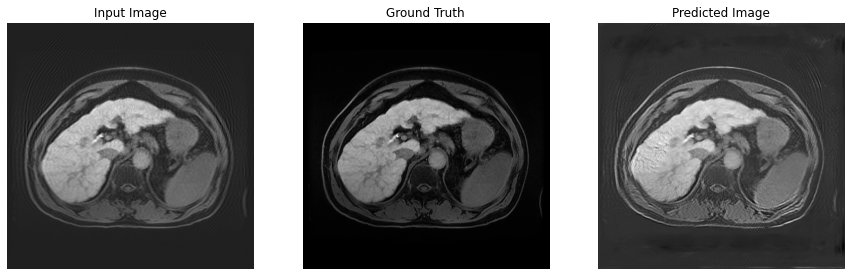

Mean Squared Error: 0.010367097333073616


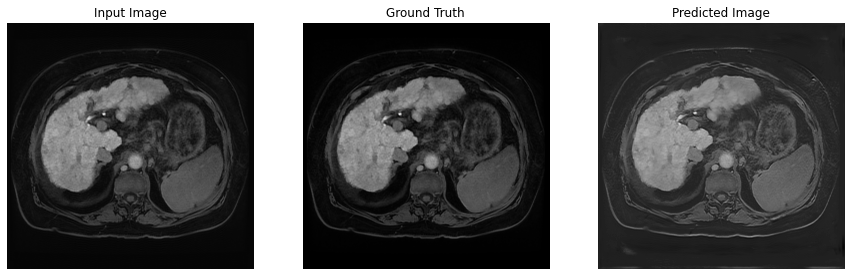

Mean Squared Error: 0.00988026987761259
Epoch:  0
Epoch:0, gen_total_loss:0.615, gen_gan_loss:0.005, gen_l1_loss:0.032, per_loss:0.579, disc_loss:0.252 
Time taken for epoch 1 is 3021.1318809986115 sec

Epoch:0, gen_total_loss_val:0.555, gen_gan_loss_val:0.003, gen_l1_loss_val:0.025, per_loss_val:0.527, disc_loss_val:0.311 
Time taken for epoch 1 is 3268.795618534088 sec



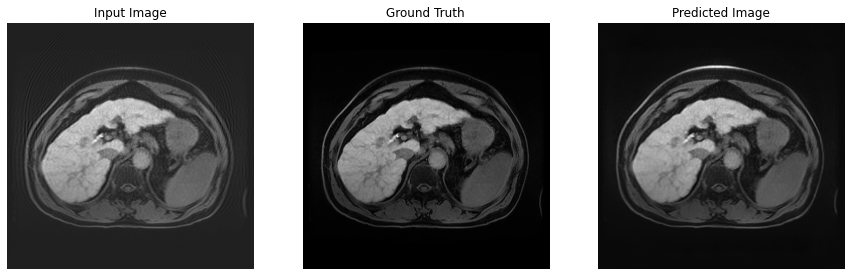

Mean Squared Error: 0.006160095799714327


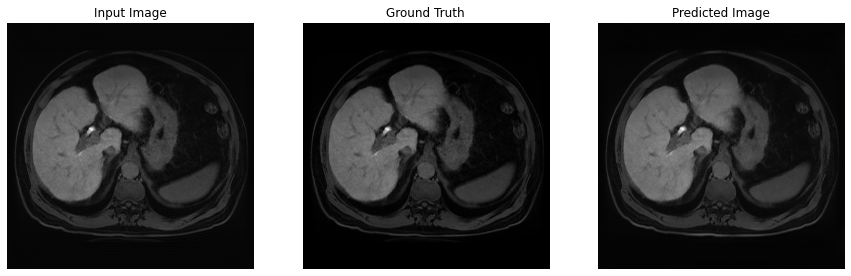

Mean Squared Error: 0.0016151455929502845
Epoch:  1
Epoch:1, gen_total_loss:0.512, gen_gan_loss:0.008, gen_l1_loss:0.028, per_loss:0.476, disc_loss:0.088 
Time taken for epoch 2 is 3035.191306591034 sec

Epoch:1, gen_total_loss_val:0.540, gen_gan_loss_val:0.006, gen_l1_loss_val:0.024, per_loss_val:0.509, disc_loss_val:0.363 
Time taken for epoch 2 is 3293.0348546504974 sec



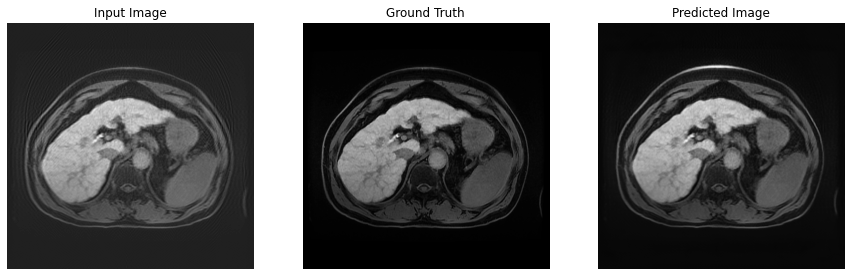

Mean Squared Error: 0.00544816255569458


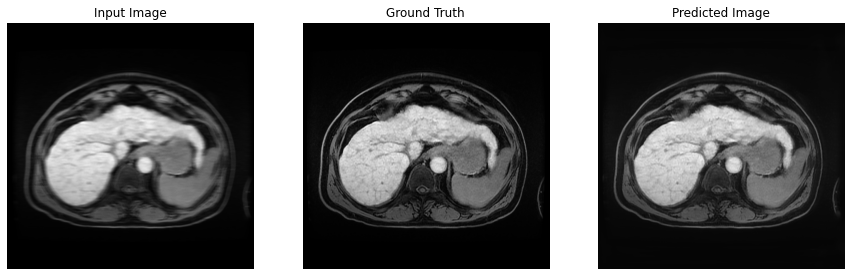

Mean Squared Error: 0.0018945602932944894
Epoch:  2
Epoch:2, gen_total_loss:0.475, gen_gan_loss:0.009, gen_l1_loss:0.026, per_loss:0.439, disc_loss:0.057 
Time taken for epoch 3 is 3013.2773144245148 sec

Epoch:2, gen_total_loss_val:0.538, gen_gan_loss_val:0.007, gen_l1_loss_val:0.024, per_loss_val:0.507, disc_loss_val:0.102 
Time taken for epoch 3 is 3267.5254275798798 sec



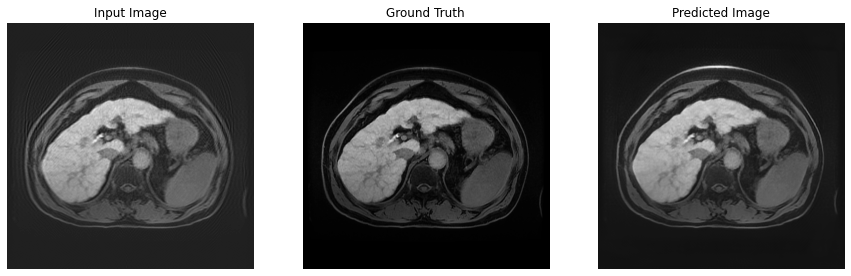

Mean Squared Error: 0.0045485240407288074


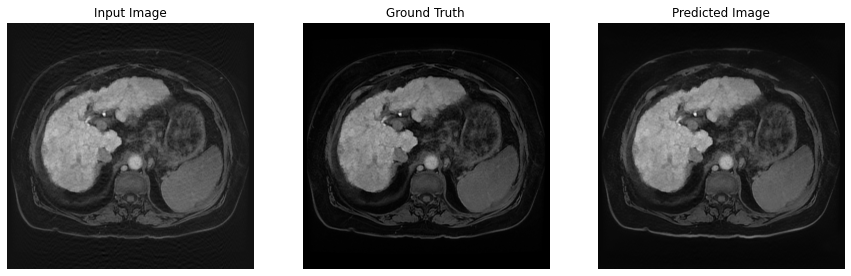

Mean Squared Error: 0.0019552528392523527
Epoch:  3
Epoch:3, gen_total_loss:0.450, gen_gan_loss:0.010, gen_l1_loss:0.026, per_loss:0.414, disc_loss:0.052 
Time taken for epoch 4 is 3009.0541563034058 sec

Epoch:3, gen_total_loss_val:0.550, gen_gan_loss_val:0.006, gen_l1_loss_val:0.026, per_loss_val:0.518, disc_loss_val:0.225 
Time taken for epoch 4 is 3262.3430590629578 sec



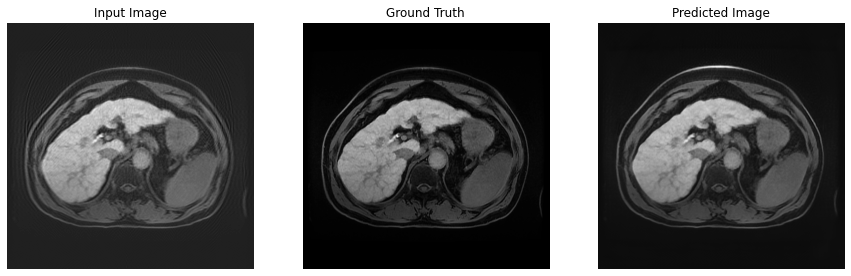

Mean Squared Error: 0.0043167853727936745


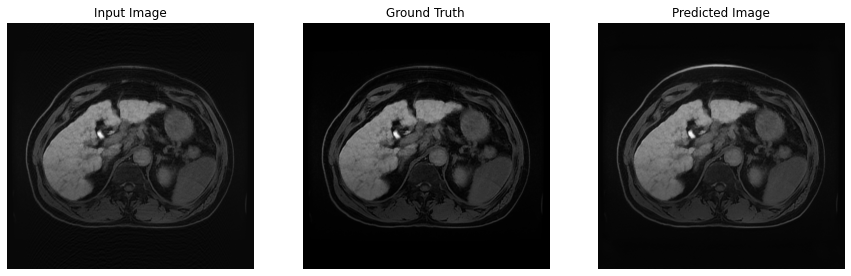

Mean Squared Error: 0.003971313592046499
Epoch:  4
Epoch:4, gen_total_loss:0.434, gen_gan_loss:0.011, gen_l1_loss:0.025, per_loss:0.398, disc_loss:0.058 
Time taken for epoch 5 is 3037.7843482494354 sec

Epoch:4, gen_total_loss_val:0.532, gen_gan_loss_val:0.007, gen_l1_loss_val:0.024, per_loss_val:0.501, disc_loss_val:0.142 
Time taken for epoch 5 is 3298.826968431473 sec



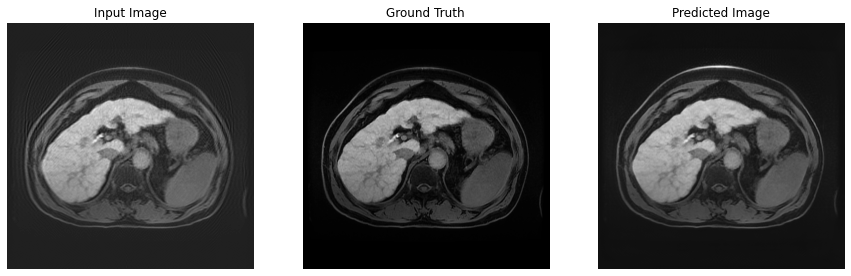

Mean Squared Error: 0.004078696947544813


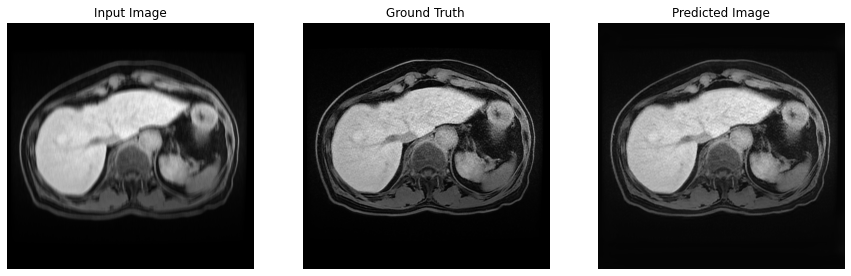

Mean Squared Error: 0.0037051525432616472
Epoch:  5
Epoch:5, gen_total_loss:0.419, gen_gan_loss:0.010, gen_l1_loss:0.025, per_loss:0.384, disc_loss:0.084 
Time taken for epoch 6 is 3027.4072649478912 sec

Epoch:5, gen_total_loss_val:0.553, gen_gan_loss_val:0.007, gen_l1_loss_val:0.026, per_loss_val:0.521, disc_loss_val:0.179 
Time taken for epoch 6 is 3278.0320200920105 sec



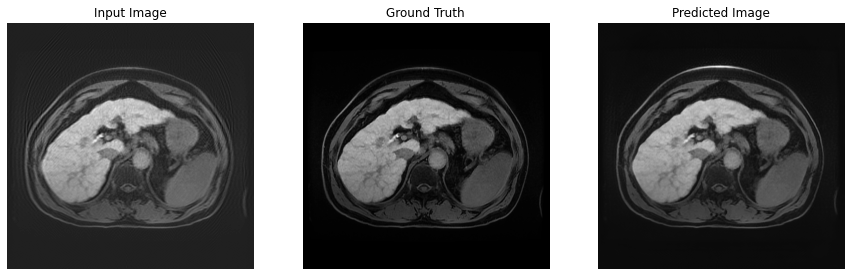

Mean Squared Error: 0.0038461831863969564


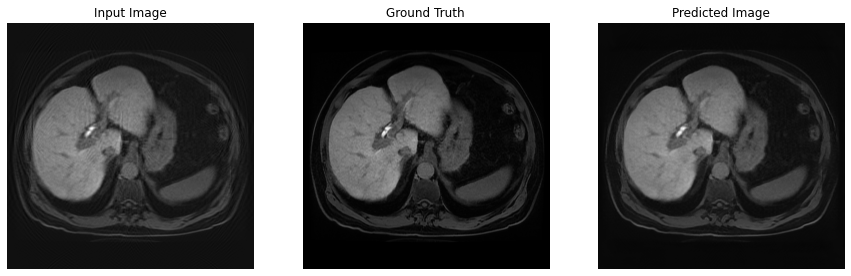

Mean Squared Error: 0.003797096898779273
Epoch:  6
Epoch:6, gen_total_loss:0.407, gen_gan_loss:0.011, gen_l1_loss:0.025, per_loss:0.371, disc_loss:0.053 
Time taken for epoch 7 is 3011.1610145568848 sec

Epoch:6, gen_total_loss_val:0.521, gen_gan_loss_val:0.006, gen_l1_loss_val:0.024, per_loss_val:0.491, disc_loss_val:0.105 
Time taken for epoch 7 is 3252.4136066436768 sec



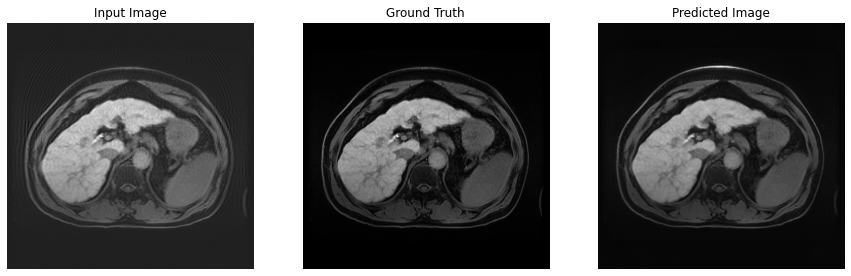

Mean Squared Error: 0.0036925058811903


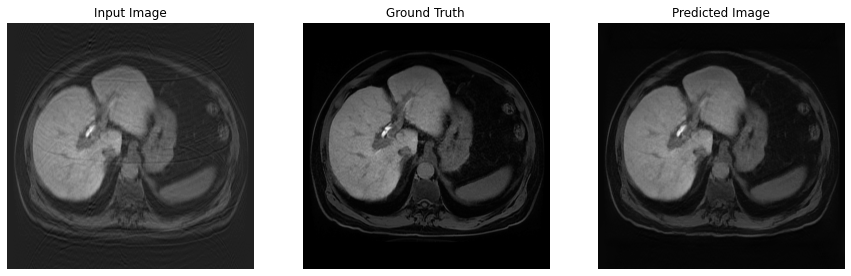

Mean Squared Error: 0.003182959510013461
Epoch:  7
Epoch:7, gen_total_loss:0.398, gen_gan_loss:0.011, gen_l1_loss:0.024, per_loss:0.362, disc_loss:0.050 
Time taken for epoch 8 is 2716.0971517562866 sec

Epoch:7, gen_total_loss_val:0.537, gen_gan_loss_val:0.008, gen_l1_loss_val:0.024, per_loss_val:0.505, disc_loss_val:0.237 
Time taken for epoch 8 is 2919.0588035583496 sec



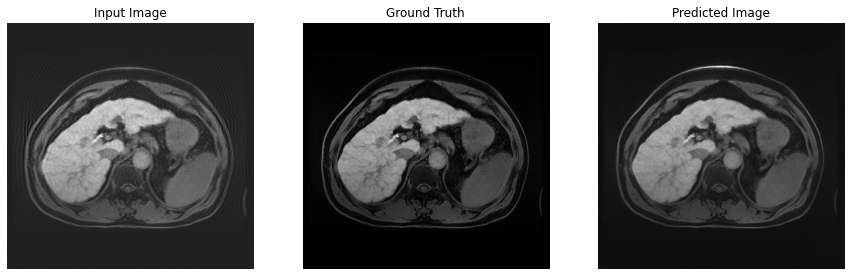

Mean Squared Error: 0.0036526049952954054


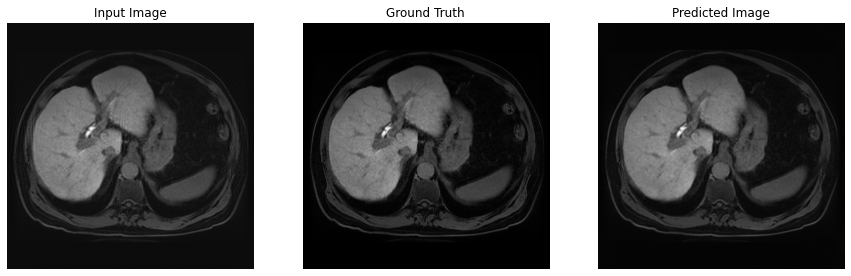

Mean Squared Error: 0.0012641716748476028
Epoch:  8
Epoch:8, gen_total_loss:0.393, gen_gan_loss:0.011, gen_l1_loss:0.024, per_loss:0.358, disc_loss:0.050 
Time taken for epoch 9 is 2716.427170276642 sec

Epoch:8, gen_total_loss_val:0.524, gen_gan_loss_val:0.007, gen_l1_loss_val:0.024, per_loss_val:0.494, disc_loss_val:0.236 
Time taken for epoch 9 is 2922.1622865200043 sec



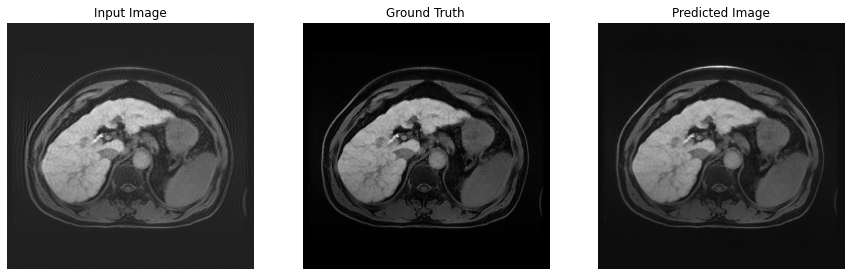

Mean Squared Error: 0.0034239105880260468


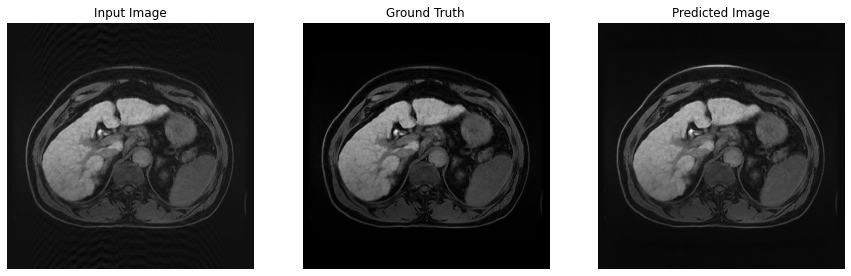

Mean Squared Error: 0.002808323595672846
Epoch:  9
Epoch:9, gen_total_loss:0.382, gen_gan_loss:0.011, gen_l1_loss:0.024, per_loss:0.347, disc_loss:0.059 
Time taken for epoch 10 is 2712.857356071472 sec

Epoch:9, gen_total_loss_val:0.526, gen_gan_loss_val:0.008, gen_l1_loss_val:0.024, per_loss_val:0.493, disc_loss_val:0.600 
Time taken for epoch 10 is 2915.4235258102417 sec



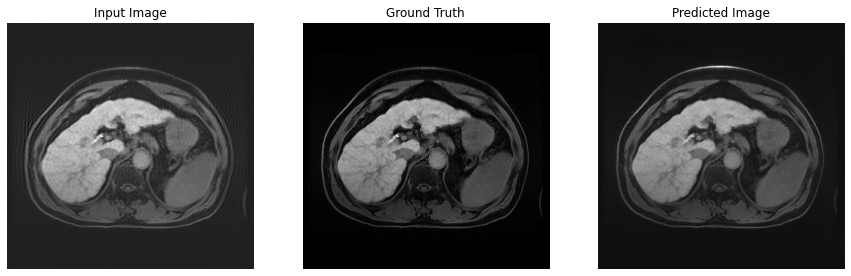

Mean Squared Error: 0.0033141274470835924


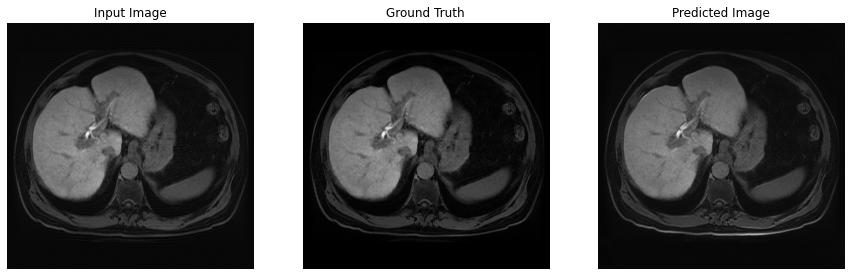

Mean Squared Error: 0.0030428855679929256
Epoch:  10
Epoch:10, gen_total_loss:0.379, gen_gan_loss:0.012, gen_l1_loss:0.024, per_loss:0.343, disc_loss:0.067 
Time taken for epoch 11 is 2711.6548211574554 sec

Epoch:10, gen_total_loss_val:0.526, gen_gan_loss_val:0.008, gen_l1_loss_val:0.025, per_loss_val:0.493, disc_loss_val:0.274 
Time taken for epoch 11 is 2919.961446046829 sec



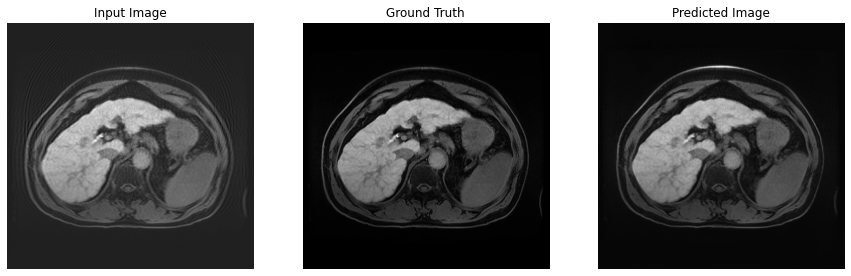

Mean Squared Error: 0.003398339496925473


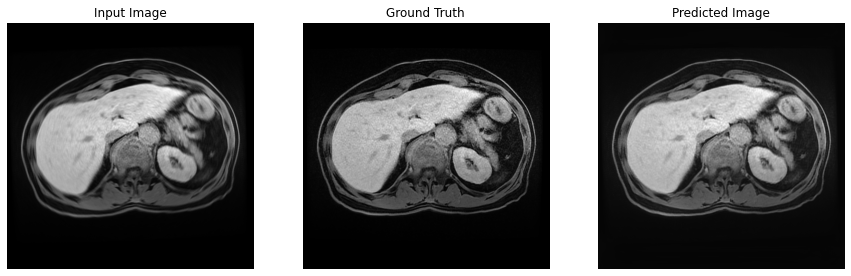

Mean Squared Error: 0.0036771607119590044
Epoch:  11
Epoch:11, gen_total_loss:0.370, gen_gan_loss:0.012, gen_l1_loss:0.024, per_loss:0.335, disc_loss:0.051 
Time taken for epoch 12 is 2720.0054972171783 sec

Epoch:11, gen_total_loss_val:0.515, gen_gan_loss_val:0.006, gen_l1_loss_val:0.024, per_loss_val:0.486, disc_loss_val:0.597 
Time taken for epoch 12 is 2930.938942670822 sec



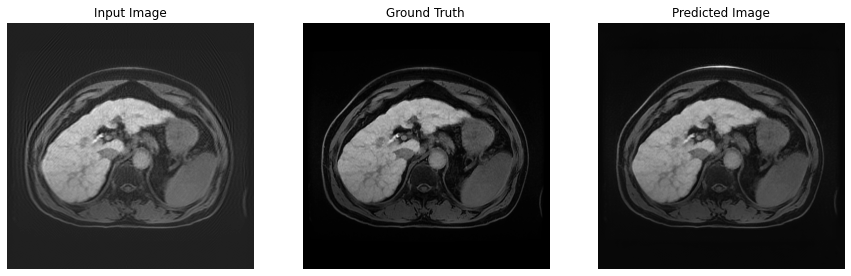

Mean Squared Error: 0.00333039416000247


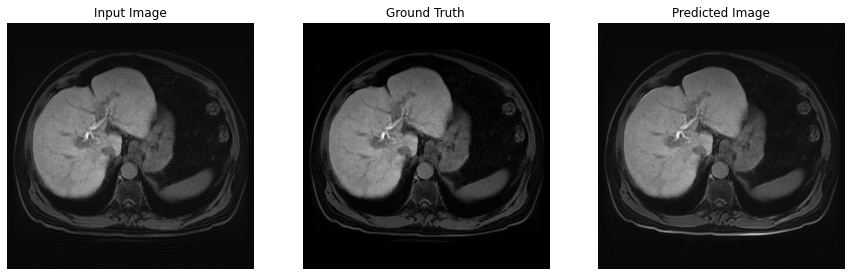

Mean Squared Error: 0.0030958042480051517
Epoch:  12
Epoch:12, gen_total_loss:0.365, gen_gan_loss:0.011, gen_l1_loss:0.024, per_loss:0.331, disc_loss:0.062 
Time taken for epoch 13 is 2721.9499678611755 sec

Epoch:12, gen_total_loss_val:0.523, gen_gan_loss_val:0.005, gen_l1_loss_val:0.024, per_loss_val:0.495, disc_loss_val:0.610 
Time taken for epoch 13 is 2926.1398746967316 sec



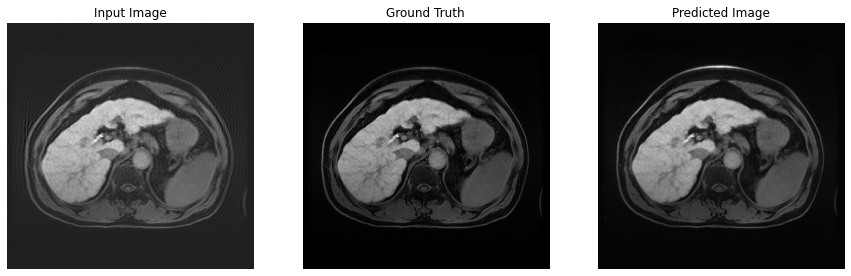

Mean Squared Error: 0.003213634015992284


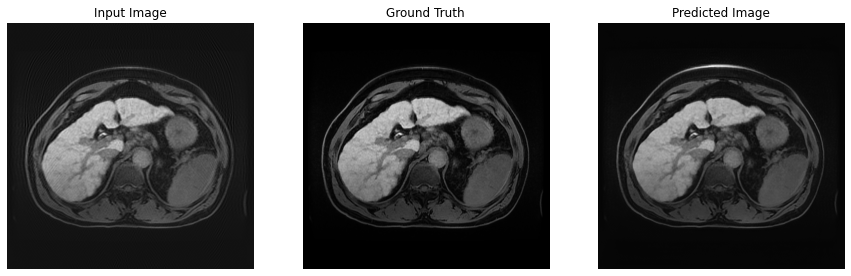

Mean Squared Error: 0.0025955745950341225
Epoch:  13
Epoch:13, gen_total_loss:0.360, gen_gan_loss:0.011, gen_l1_loss:0.024, per_loss:0.325, disc_loss:0.061 
Time taken for epoch 14 is 2721.0343115329742 sec

Epoch:13, gen_total_loss_val:0.524, gen_gan_loss_val:0.005, gen_l1_loss_val:0.025, per_loss_val:0.495, disc_loss_val:0.403 
Time taken for epoch 14 is 2923.6200478076935 sec



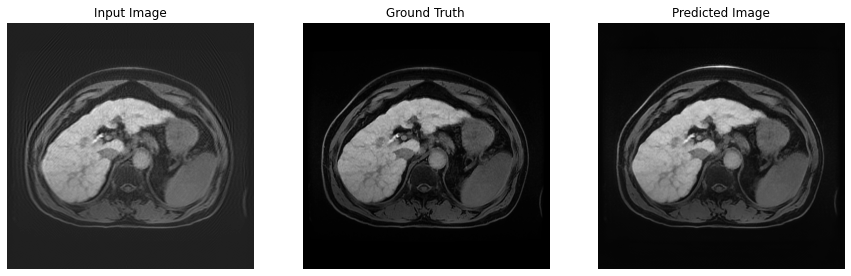

Mean Squared Error: 0.003140111919492483


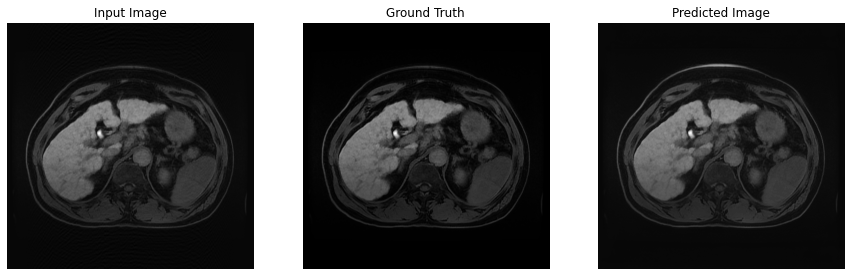

Mean Squared Error: 0.002527738455682993
Epoch:  14
Epoch:14, gen_total_loss:0.362, gen_gan_loss:0.011, gen_l1_loss:0.024, per_loss:0.326, disc_loss:0.052 
Time taken for epoch 15 is 2709.822423219681 sec

Epoch:14, gen_total_loss_val:0.517, gen_gan_loss_val:0.007, gen_l1_loss_val:0.024, per_loss_val:0.486, disc_loss_val:0.231 
Time taken for epoch 15 is 2913.8300545215607 sec



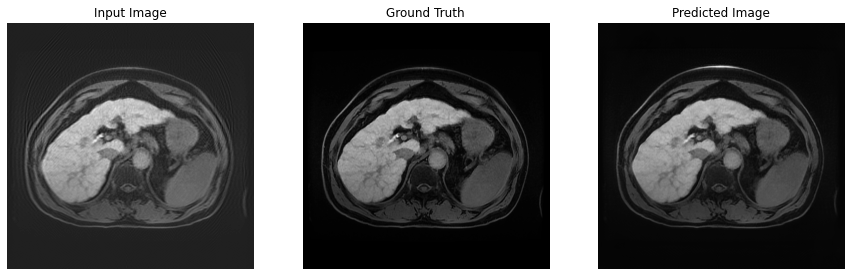

Mean Squared Error: 0.003205867251381278


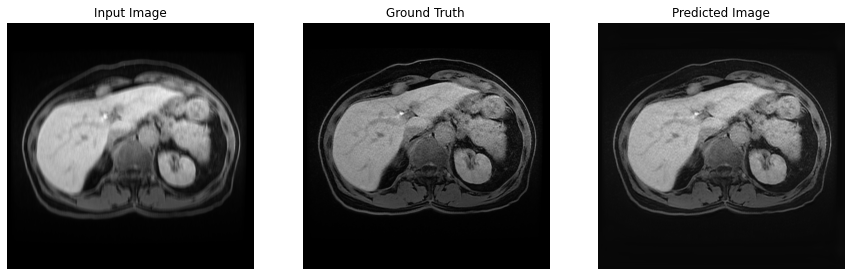

Mean Squared Error: 0.0028764379676431417
Epoch:  15
Epoch:15, gen_total_loss:0.353, gen_gan_loss:0.012, gen_l1_loss:0.024, per_loss:0.317, disc_loss:0.052 
Time taken for epoch 16 is 2708.7530455589294 sec

Epoch:15, gen_total_loss_val:0.547, gen_gan_loss_val:0.009, gen_l1_loss_val:0.025, per_loss_val:0.514, disc_loss_val:0.401 
Time taken for epoch 16 is 2918.921548843384 sec



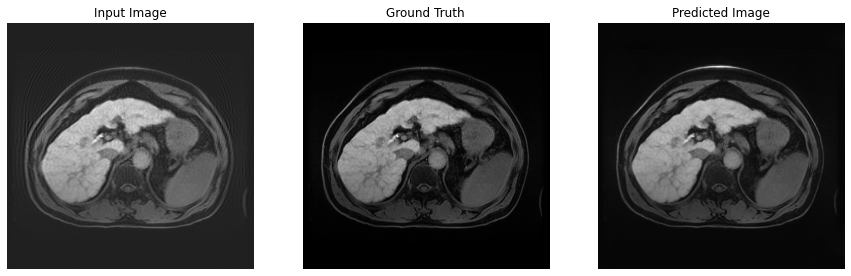

Mean Squared Error: 0.003203906584531069


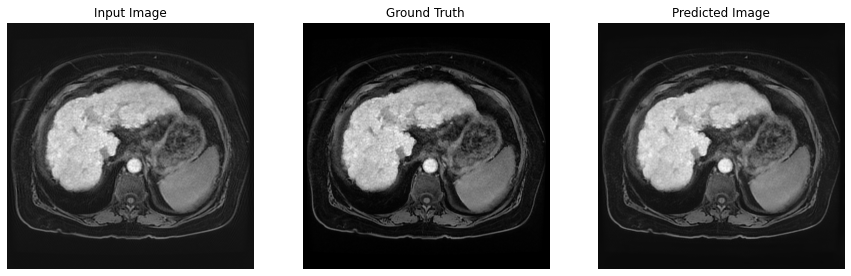

Mean Squared Error: 0.003217273158952594
Epoch:  16
Epoch:16, gen_total_loss:0.347, gen_gan_loss:0.012, gen_l1_loss:0.023, per_loss:0.312, disc_loss:0.054 
Time taken for epoch 17 is 2716.2319192886353 sec

Epoch:16, gen_total_loss_val:0.527, gen_gan_loss_val:0.006, gen_l1_loss_val:0.024, per_loss_val:0.497, disc_loss_val:0.696 
Time taken for epoch 17 is 2925.2825706005096 sec



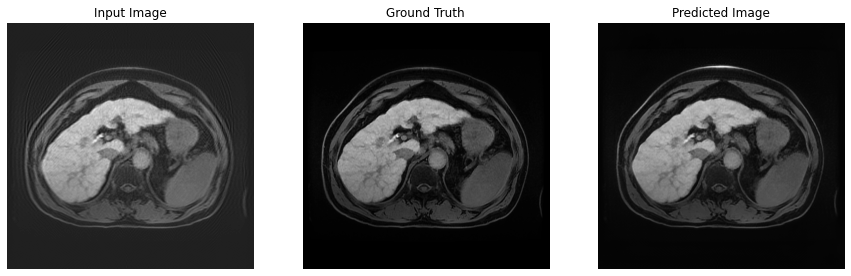

Mean Squared Error: 0.0030197412706911564


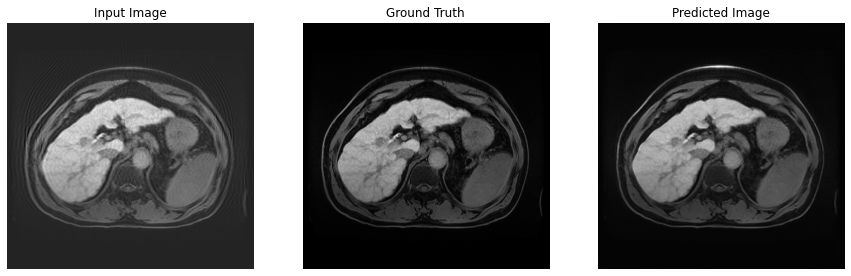

Mean Squared Error: 0.0034401717130094767
Epoch:  17
Epoch:17, gen_total_loss:0.344, gen_gan_loss:0.012, gen_l1_loss:0.024, per_loss:0.309, disc_loss:0.050 
Time taken for epoch 18 is 2721.735585451126 sec



In [28]:
EPOCHS = 50

fit(train_dataset, EPOCHS, test_dataset)

In [28]:
# for inp, tar in test_dataset.take(20):
#     generate_images(generator_network, inp, tar)

In [43]:
checkpoint_dir = './model/percep_latest/'
latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

In [44]:
# for inp, tar in test_dataset.take(30):
#     generate_images(checkpoint.generator, inp, tar)
#     checkpoint.generator(inp)

In [45]:
def load_test(image_file):
    
    image = tf.io.read_file(image_file)
    image = tf.image.decode_png(image, channels=1)

    input_image = tf.cast(image, tf.float32)
    input_image = (input_image / 127.5) - 1

    return input_image
PATH_test = '/home/yunan/motion/liver paper real motion test images/motion_img/'
motion_dataset = tf.data.Dataset.list_files(PATH_test +'*.png')
motion_dataset = motion_dataset.map(load_test)   # change here
motion_dataset = motion_dataset.batch(1)

(1, 512, 512, 1)


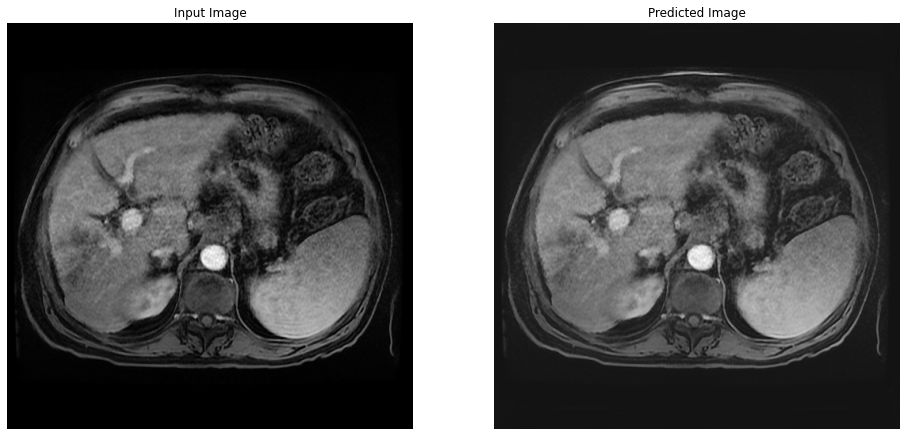

(1, 512, 512, 1)


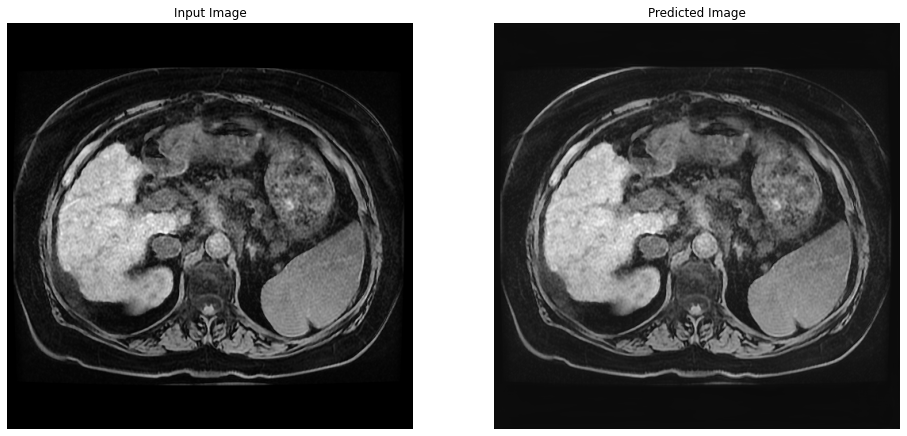

(1, 512, 512, 1)


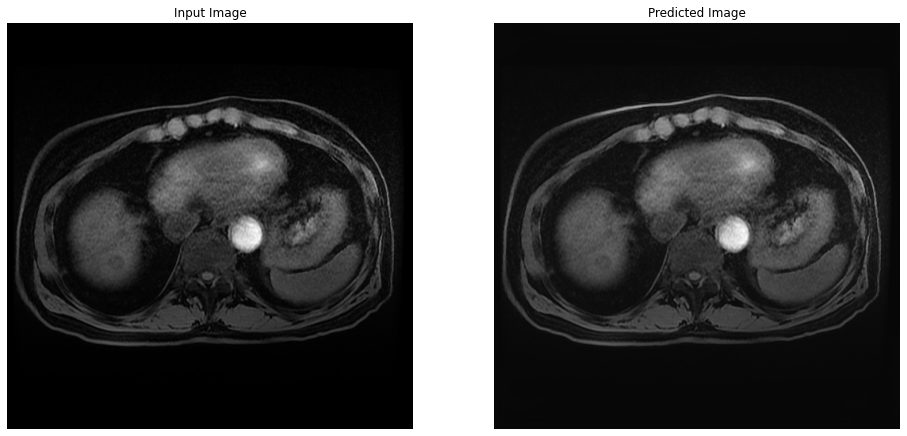

(1, 512, 512, 1)


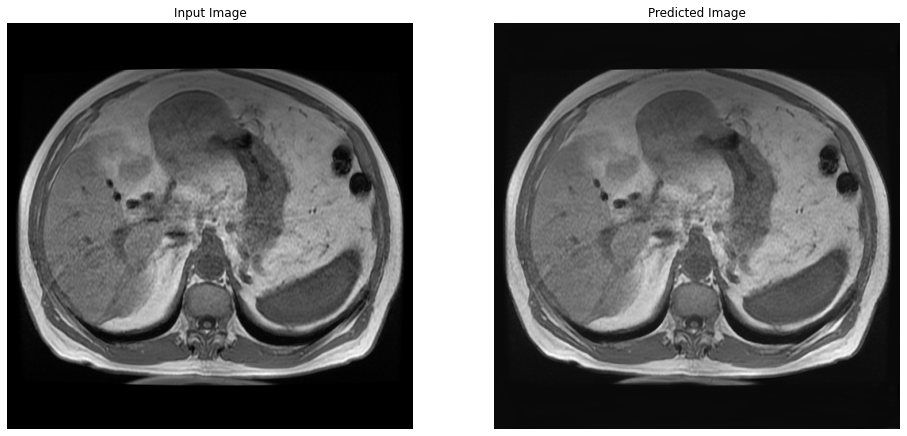

(1, 512, 512, 1)


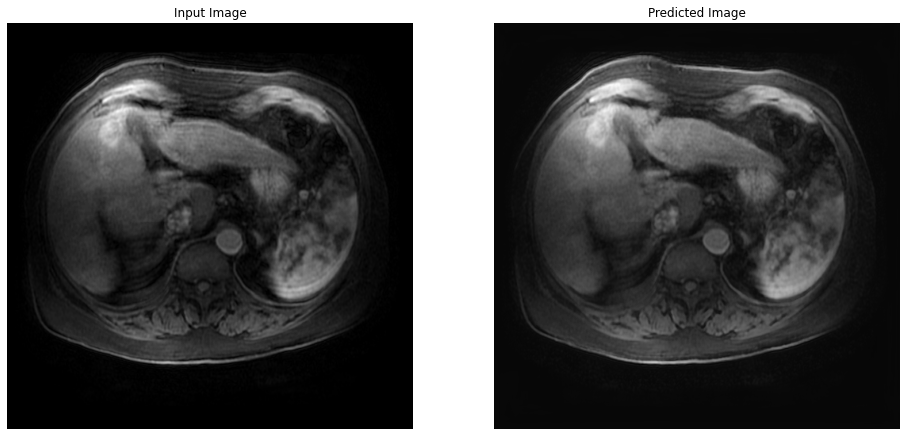

(1, 512, 512, 1)


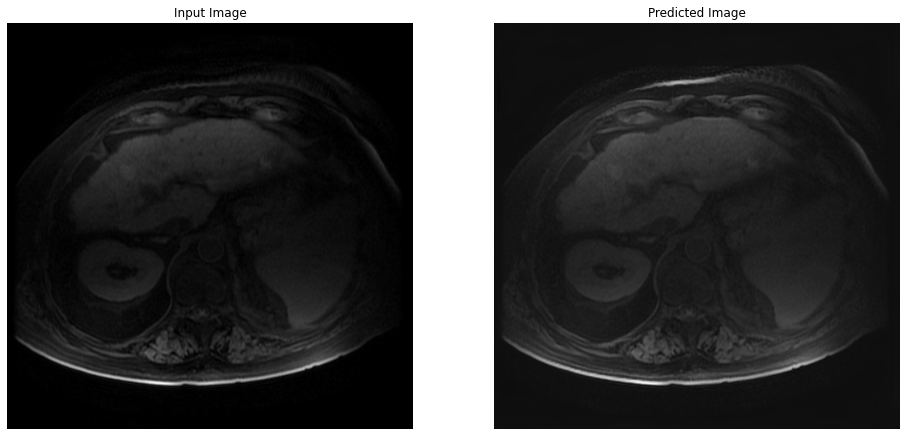

(1, 512, 512, 1)


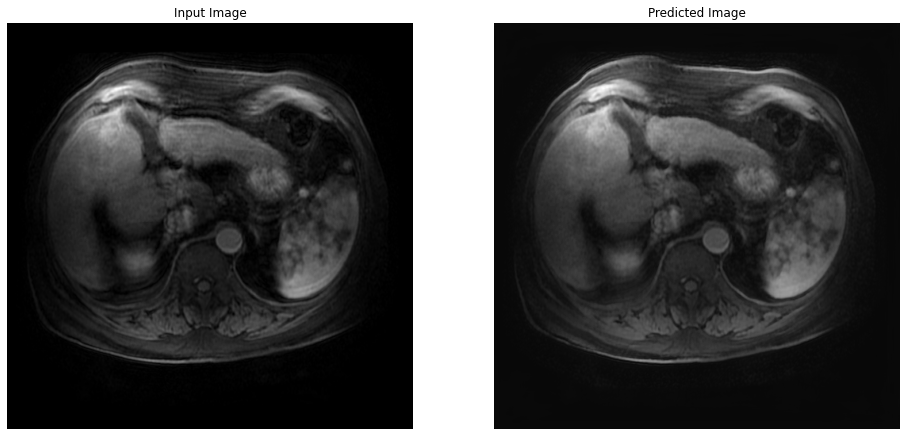

(1, 512, 512, 1)


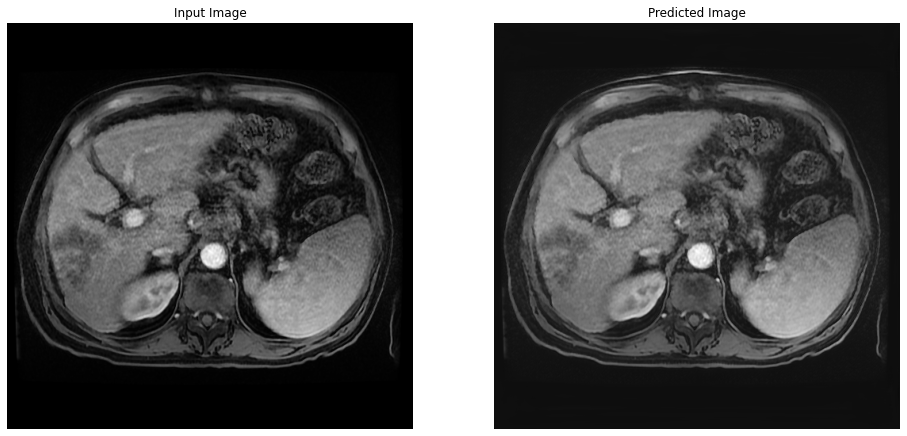

(1, 512, 512, 1)


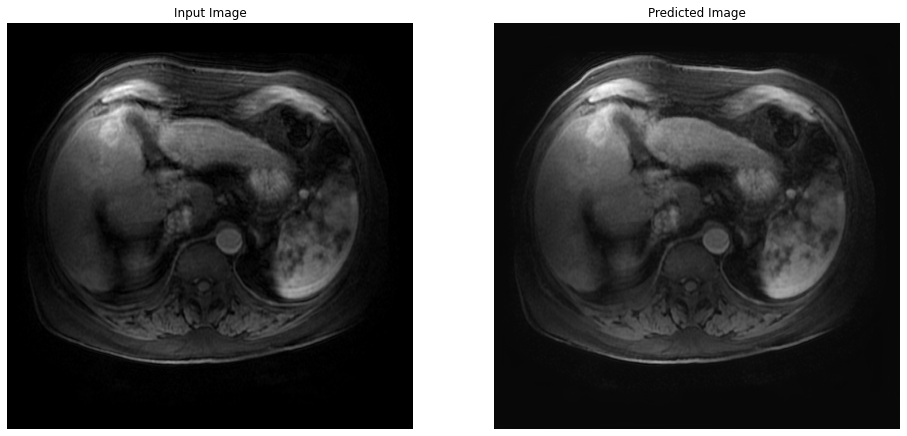

(1, 512, 512, 1)


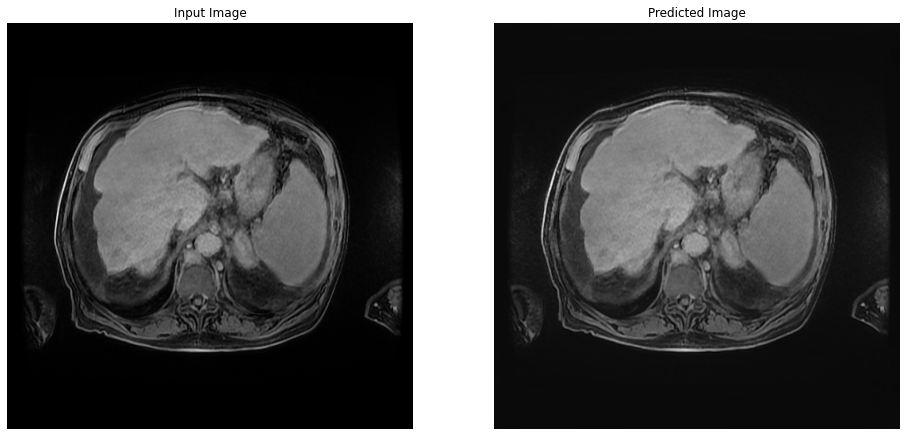

(1, 512, 512, 1)


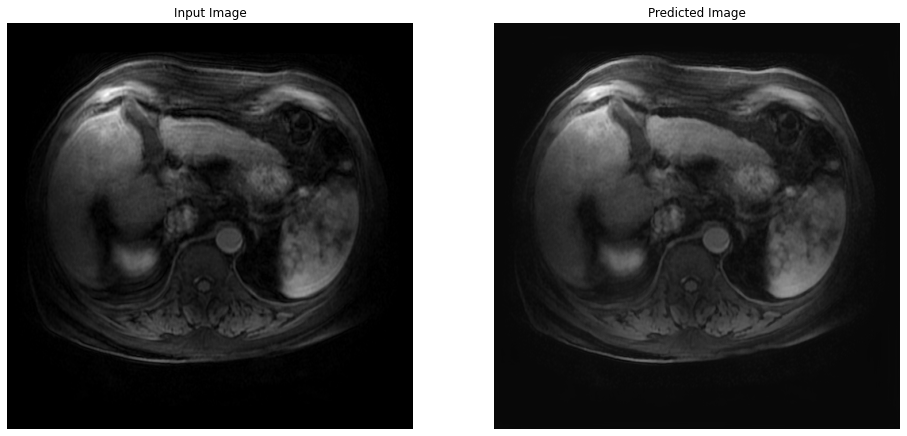

(1, 512, 512, 1)


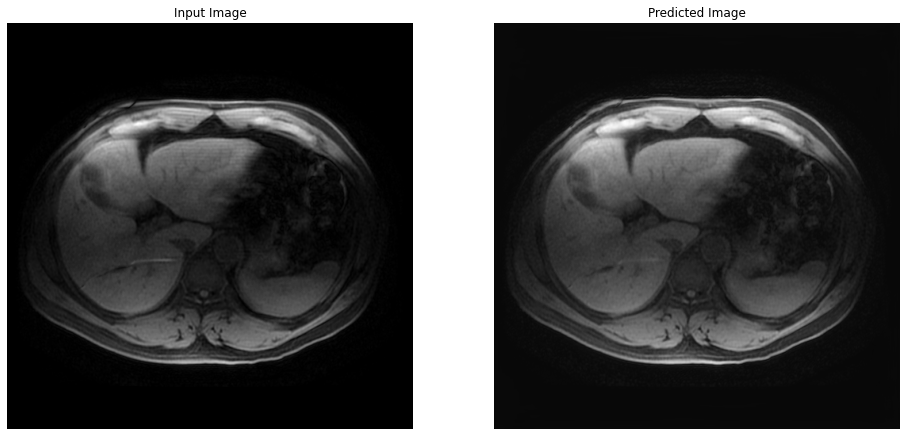

(1, 512, 512, 1)


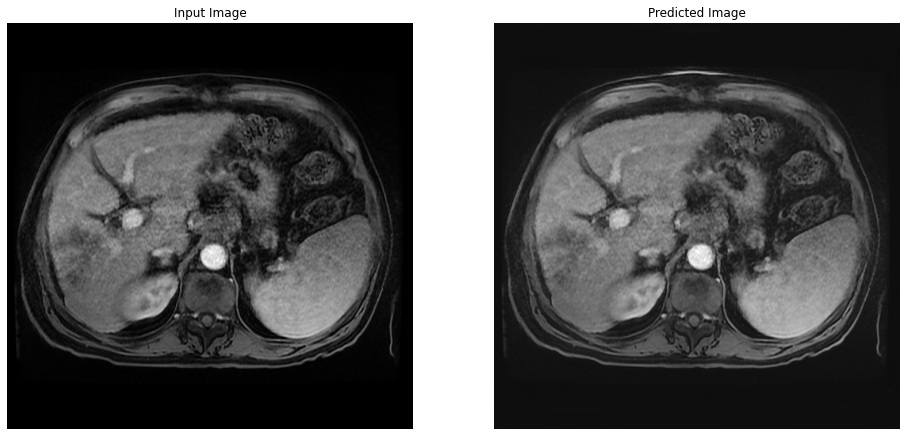

(1, 512, 512, 1)


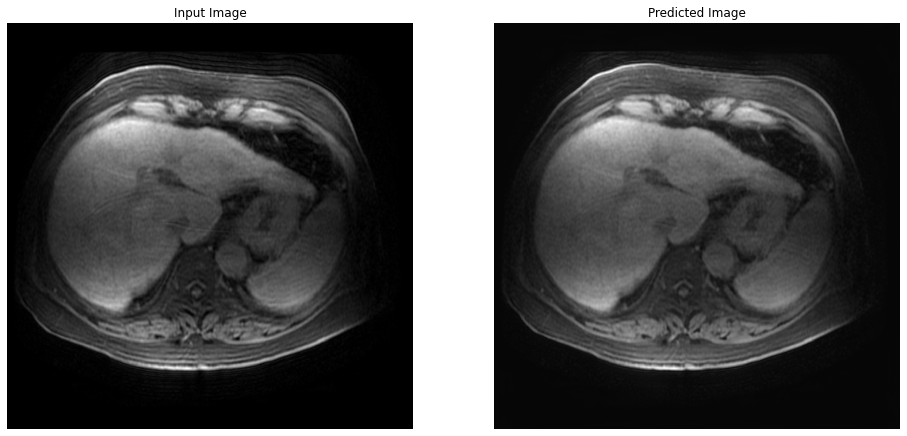

(1, 512, 512, 1)


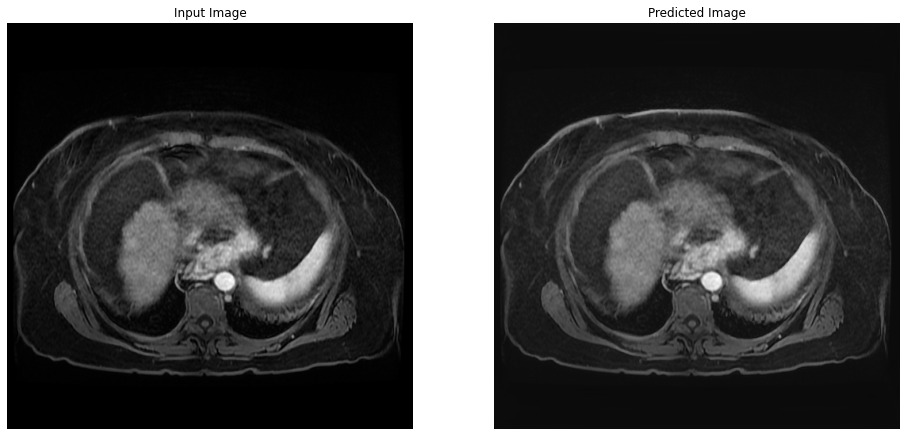

(1, 512, 512, 1)


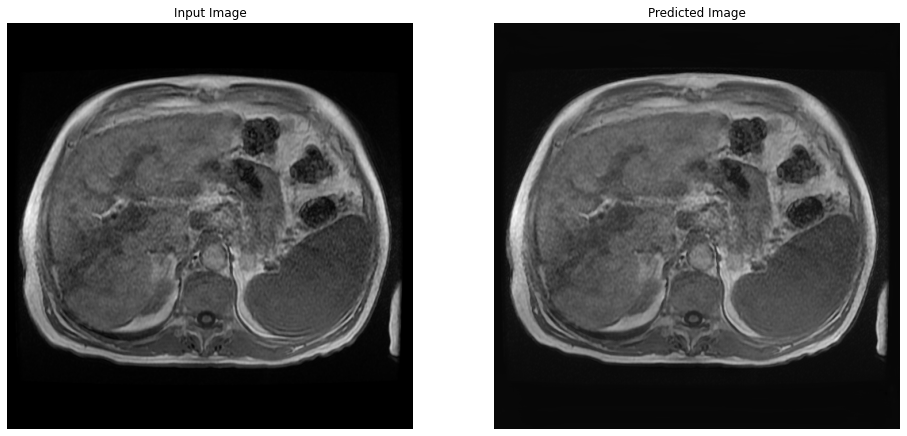

(1, 512, 512, 1)


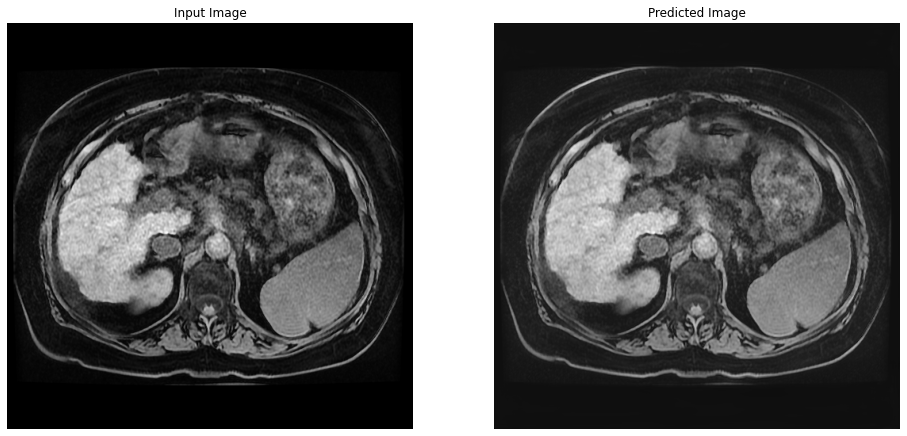

(1, 512, 512, 1)


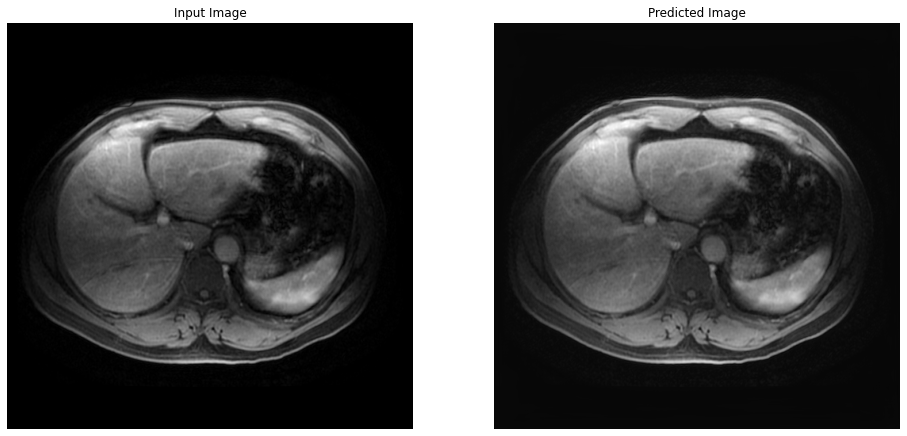

(1, 512, 512, 1)


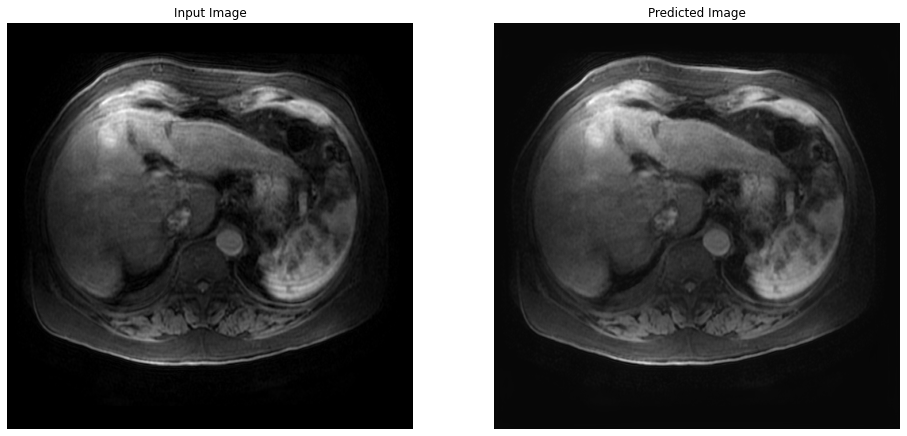

(1, 512, 512, 1)


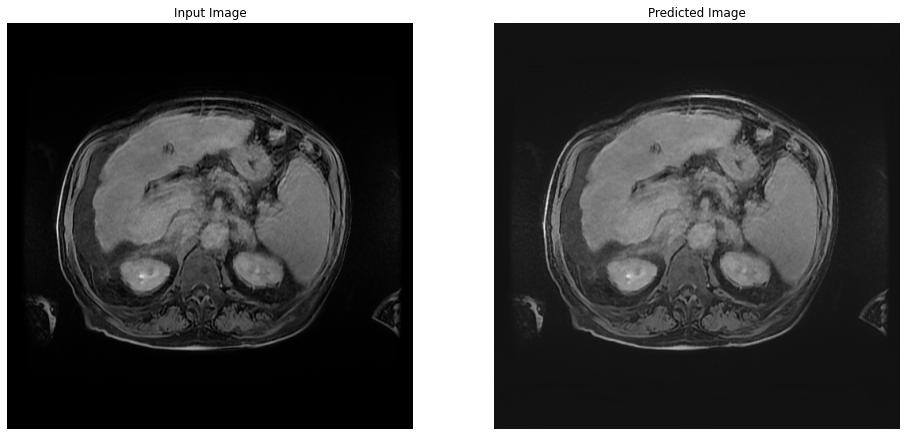

(1, 512, 512, 1)


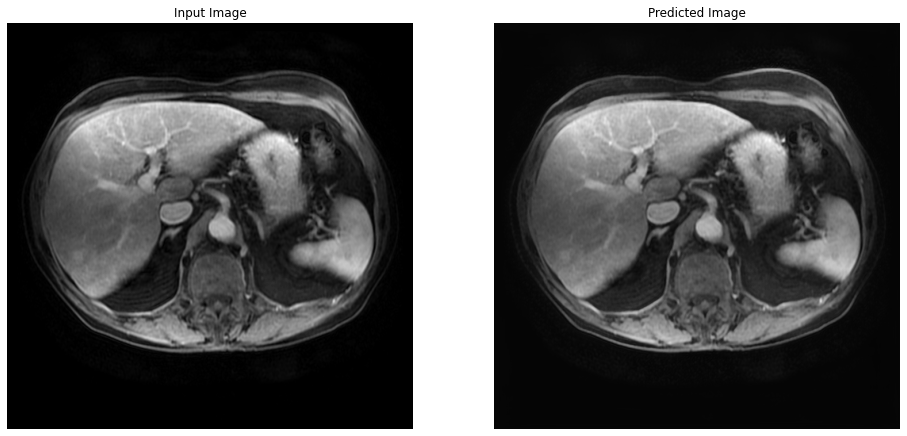

(1, 512, 512, 1)


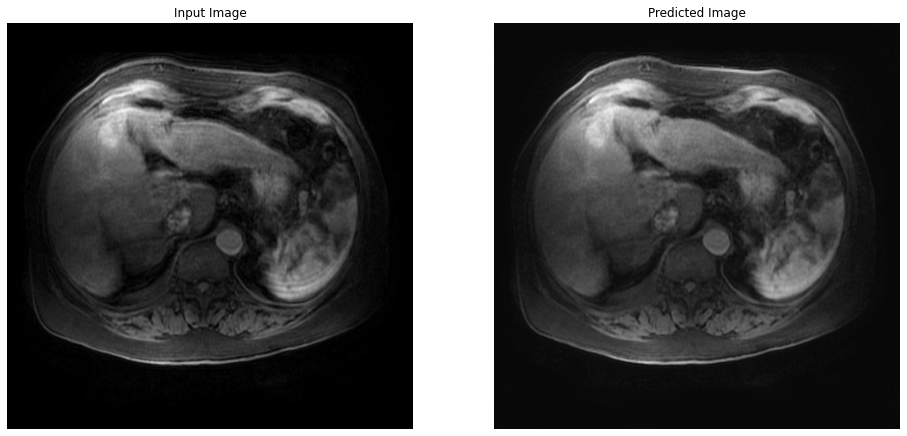

(1, 512, 512, 1)


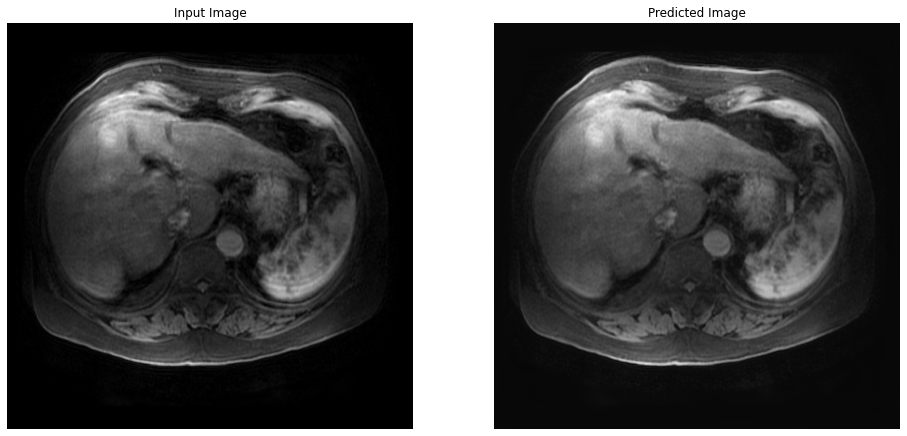

(1, 512, 512, 1)


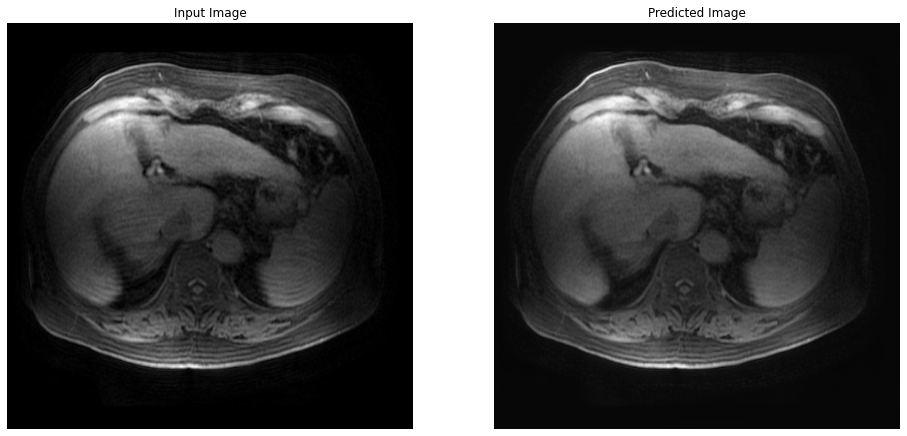

(1, 512, 512, 1)


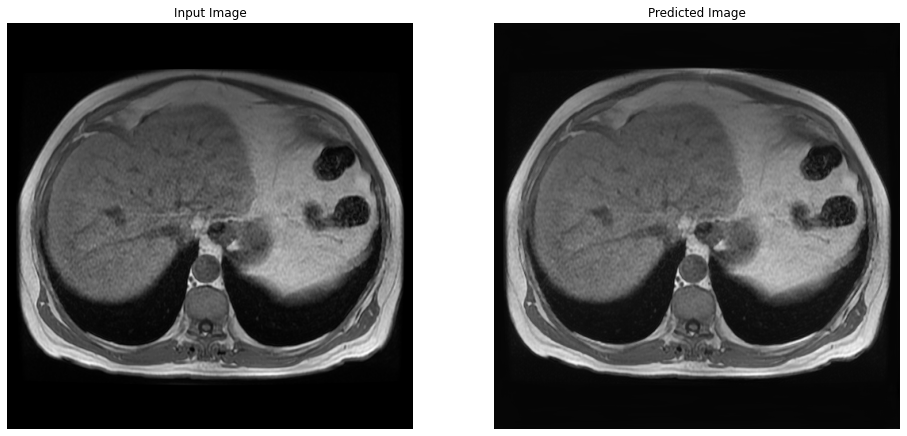

(1, 512, 512, 1)


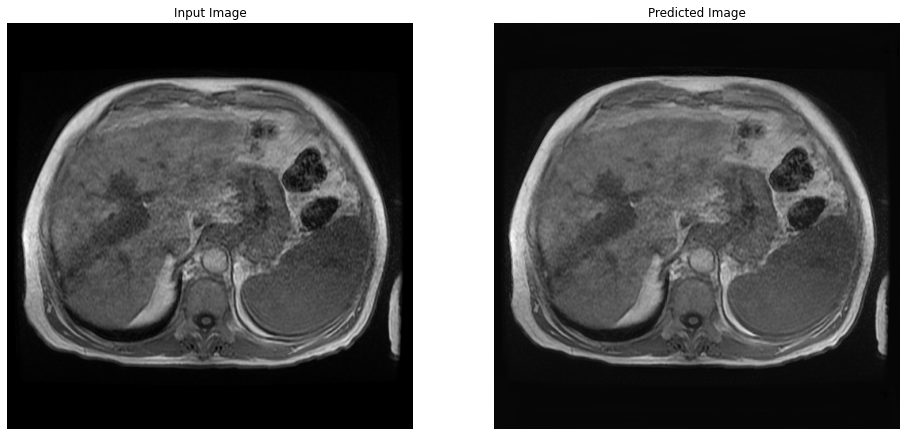

(1, 512, 512, 1)


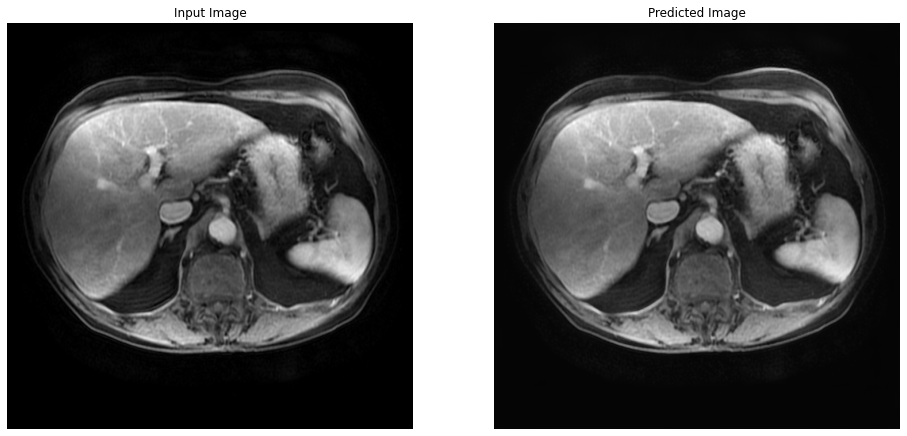

(1, 512, 512, 1)


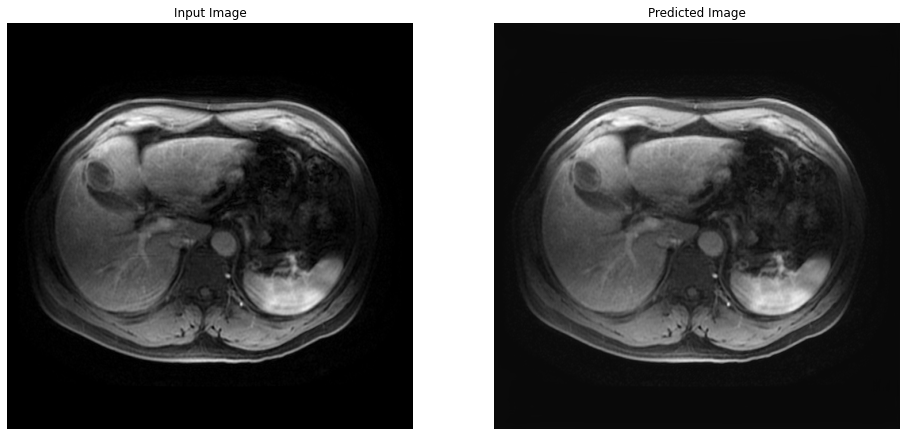

In [48]:
j = 0
for inp in motion_dataset.take(28):
    prediction = checkpoint.generator(inp, training=True)
#     print(prediction.shape)
    plt.figure(figsize=(16,8))

    display_list = [inp[0], prediction[0]]
    title = ['Input Image', 'Predicted Image']

    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i][:,:,0] * 0.5 + 0.5, cmap='gray')
#         plt.imshow(display_list[1][:,:,0] * 0.5 + 0.5, cmap='gray')
        plt.axis('off')
    plt.imsave('{}.png'.format(j), display_list[i][:,:,0], cmap='gray')
    plt.imsave('{}_TRUE.png'.format(j), display_list[0][:,:,0], cmap='gray')
    plt.show()
    j = j + 1

In [78]:
for i in range(28):
    image = cv2.imread('/home/yunan/motion/{}.png'.format(i))

    alpha = 2.5 # Contrast control (1.0-3.0)
    beta = 40 # Brightness control (0-100)

    adjusted = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    cv2.imwrite('adjusted_2_{}.png'.format(i), adjusted)

# cv2.imshow('original', image)
# cv2.imshow('adjusted', adjusted)
# cv2.waitKey()

In [34]:
BUFFER_SIZE = 200
BATCH_SIZE_test = 1

test_dataset = tf.data.Dataset.list_files(PATH+'full_val/*.png', shuffle = False)
test_dataset = test_dataset.shuffle(BUFFER_SIZE, reshuffle_each_iteration=False)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE_test)

In [35]:
# predict SSIM ans MSE
from skimage.measure import compare_ssim as ssim
from skimage.measure import compare_mse as mse

SS = []
MSE = []

for n, (input_image, target) in test_dataset.enumerate():
    target1 = target[0,:,:,0].numpy()
#     print(target1)
#     input_image1 = input_image[0,:,:,0].numpy()
    predd= checkpoint.generator(input_image, training=False)
#     print(prediction.shape)
    prediction = predd[0,:,:,0].numpy()
    score = ssim(target1, prediction)
    msee = mse(target1, prediction)
#     print(msee)
#     print(score)
    SS.append(score)
    MSE.append(msee)      

In [36]:
print('ssim_mean:' ,np.mean(SS), 'ssim_std:', np.std(SS))

print('mse_mean:' ,np.mean(MSE), 'mse_std:', np.std(MSE))

ssim_mean: 0.909441891711987 ssim_std: 0.06856463343004639
mse_mean: 0.003192125245803238 mse_std: 0.004126750158228062


In [22]:
PATH_test = '/home/yunan/motion/liver paper real motion test images/valid/'
motion_dataset = tf.data.Dataset.list_files(PATH_test +'*.png')
motion_dataset = motion_dataset.map(load_image_train)   # change here
motion_dataset = motion_dataset.batch(1)

In [28]:
# j = 0
# for example_input, example_target in motion_dataset.take(4):
# #     tf.print(tf.shape(example_input)) # [2 512 512 1]
# #     tf.print(tf.shape(example_target))# [2 512 512 1]
#     prediction = generator(example_input, training=False)
#     plt.imsave('val_{}.png'.format(j), prediction[0,:,:,0], cmap='gray')
#     j = j + 1

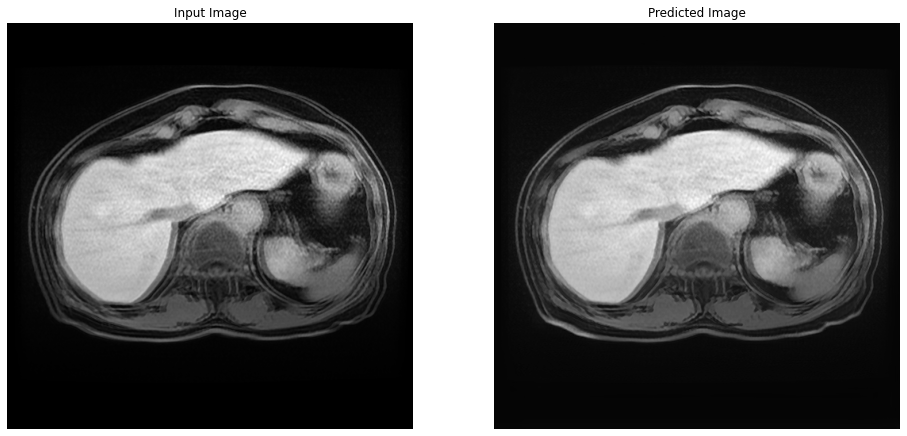

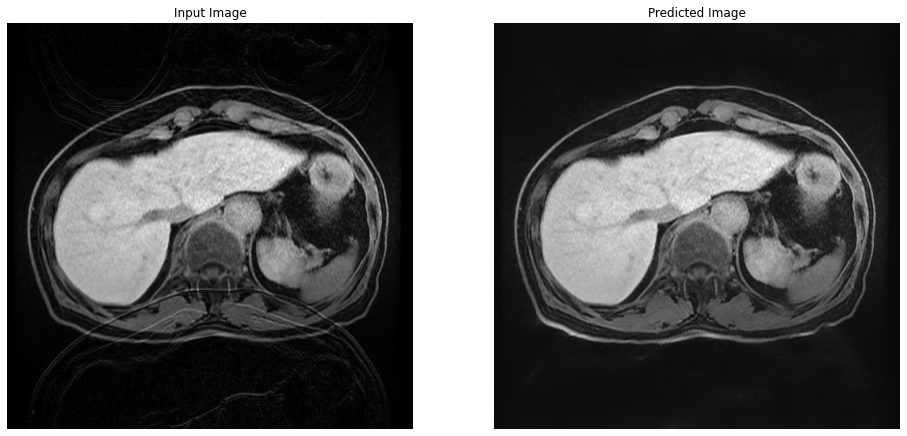

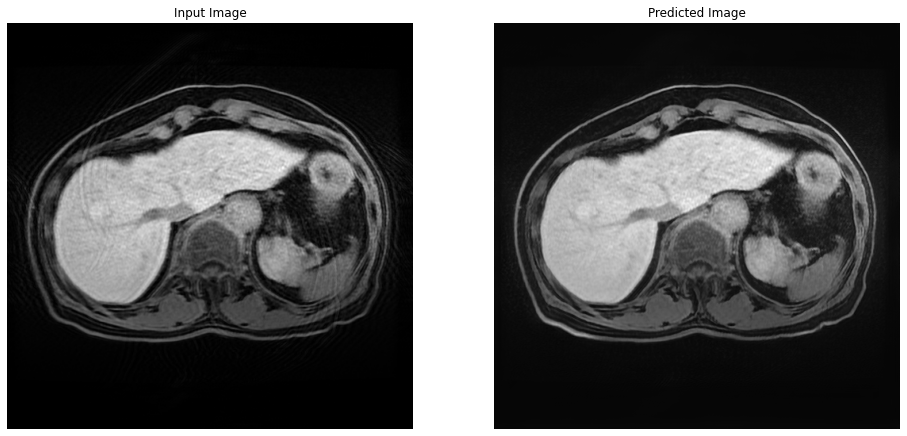

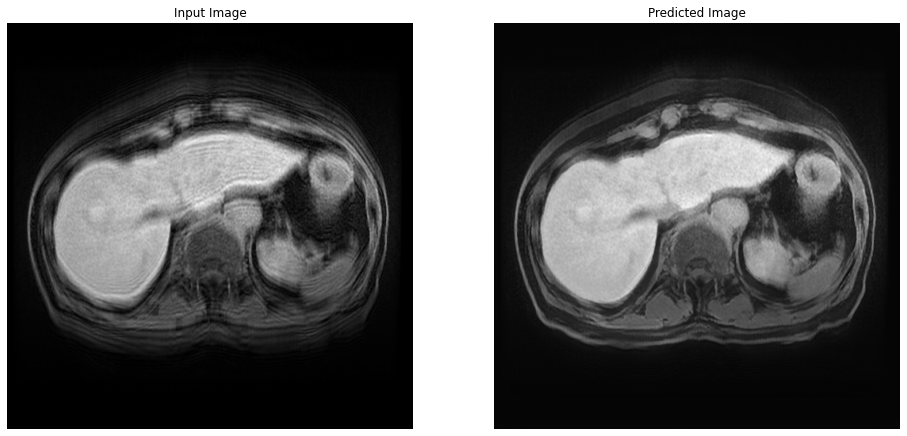

In [46]:
j = 0
for inp in motion_dataset.take(4):
    prediction = checkpoint.generator(inp, training=False)
#     print(inp)
    plt.figure(figsize=(16,8))

    display_list = [inp[0], prediction]
    title = ['Input Image', 'Predicted Image']

    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i][0,:,:,0] * 0.5 + 0.5, cmap='gray')
#         plt.imshow(display_list[1][:,:,0] * 0.5 + 0.5, cmap='gray')
        plt.axis('off')
    plt.imsave('val_{}.png'.format(j), display_list[i][0,:,:,0], cmap='gray')
    plt.show()
    j = j + 1